In [1]:
import pandas as pd
import numpy as np
import glob
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn
import json
import csv
from datetime import date, datetime, timedelta

import os
import requests
from bs4 import BeautifulSoup
import folium
import branca.colormap as cm

#import scipy.io as sio
#
#from scipy import interp
#
#from sklearn.preprocessing import StandardScaler
#from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
#from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
#from sklearn.svm import SVC
#import xgboost as xgb
#from sklearn.model_selection import GridSearchCV
#from sklearn.model_selection import StratifiedKFold
#from sklearn.externals import joblib
#
#from sklearn.model_selection import train_test_split
#from sklearn.metrics import roc_curve, auc
#from sklearn.metrics import confusion_matrix
##import scikitplot as skplt

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
def show_nan(df, size=(16,20), y_ticks=None, show_axis=False, only_date=False):
    plt.figure(figsize=size)
    plt.imshow(df.isnull().values, aspect='auto', interpolation="none")#"nearest""antialiased"
    plt.xticks(range(df.shape[1]),df.columns.tolist(),rotation=90)
    if y_ticks:
        if only_date:
            plt.yticks(y_ticks,df.index[y_ticks].date.tolist())
        else:
            plt.yticks(y_ticks,df.index[y_ticks].tolist())
    if show_axis:
        ax = plt.gca()
        ax.set_xticks(np.arange(0.5, df.shape[1],1),minor=True)
        plt.grid(which="minor",axis="x",color="w",linewidth=0.5)
    plt.show()

# Import

## River Discharges

In [3]:
Stations_info = pd.read_csv("data_wrangled/info_discharges_initial.csv", encoding="latin", index_col=0)
Stations_info = Stations_info.rename(columns={"Name.y":"Name","ID":"BAFU_ID"})
Stations_info.index.name = "id"

Discharges = pd.read_csv("data_wrangled/Discharges_all.csv")
Discharges["Date"]=pd.to_datetime(Discharges.Date)
Discharges.set_index("Date",inplace=True)
Discharges.sort_index(inplace=True)

Summer = pd.read_csv("data_wrangled/Discharges_summer.csv")
Summer["Date"]=pd.to_datetime(Summer.Date)
Summer.set_index("Date",inplace=True)
Summer.sort_index(inplace=True)

In [4]:
Stations_info

,Name,BAFU_ID,X,Y,Ave
id,,,,,
1,Allenbach-Adelboden,2232,608710,148300,1.207149
2,Grosstalbach-Isenthal,2276,685500,196050,1.795246
3,"Alpbach-Erstfeld, Bodenberg",2299,688560,185120,1.584263
4,Simme-Oberried / Lenk,2219,602630,141660,2.107648
5,Murg-Wängi,2126,714105,261720,1.835344
...,...,...,...,...,...
64,Reuss-Mellingen,2018,662830,252580,140.732404
65,Rhein-Domat/Ems,2602,753890,189370,117.615329
66,"Rhein-Diepoldsau, Rietbrücke",2473,766280,250360,230.536477


In [5]:
Discharges

,station_1,station_2,station_3,station_4,station_5,station_6,station_7,station_8,station_9,station_10,...,station_59,station_60,station_61,station_62,station_63,station_64,station_65,station_66,station_67,station_68
Date,,,,,,,,,,,,,,,,,,,,,
1913-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.060,NaN,NaN,...,33.100,NaN,70.200,NaN,NaN,82.300,41.100,NaN,NaN,NaN
1913-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.750,NaN,NaN,...,29.200,NaN,60.900,NaN,NaN,83.600,40.200,NaN,NaN,NaN
1913-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.300,NaN,NaN,...,24.700,NaN,51.100,NaN,NaN,82.300,41.100,NaN,NaN,NaN
1913-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.020,NaN,NaN,...,23.800,NaN,46.600,NaN,NaN,64.900,41.100,NaN,NaN,NaN
1913-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.650,NaN,NaN,...,22.100,NaN,34.900,NaN,NaN,58.800,41.100,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-27,0.384,0.593,0.153,0.379,1.366,1.622,3.996,2.289,0.612,3.002,...,7.482,11.883,38.807,48.716,64.752,71.461,49.942,104.465,669.336,690.783
2014-12-28,0.402,0.592,0.137,0.394,1.352,1.547,5.184,2.175,0.606,3.072,...,7.034,11.789,38.616,48.370,64.158,71.827,56.323,100.024,698.601,734.310
2014-12-29,0.358,0.591,0.124,0.522,1.441,1.384,3.795,1.946,0.575,2.916,...,33.886,36.202,37.130,46.835,62.166,68.811,117.166,154.601,650.641,683.995


In [6]:
Summer

,station_1,station_2,station_3,station_4,station_5,station_6,station_7,station_8,station_9,station_10,...,station_59,station_60,station_61,station_62,station_63,station_64,station_65,station_66,station_67,station_68
Date,,,,,,,,,,,,,,,,,,,,,
1913-06-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.650,NaN,NaN,...,59.700,NaN,210.000,NaN,NaN,218.400,411.000,NaN,NaN,NaN
1913-06-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.520,NaN,NaN,...,49.700,NaN,220.000,NaN,NaN,222.100,402.000,NaN,NaN,NaN
1913-06-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.650,NaN,NaN,...,47.800,NaN,221.000,NaN,NaN,227.600,432.000,NaN,NaN,NaN
1913-06-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.770,NaN,NaN,...,45.000,NaN,223.000,NaN,NaN,231.200,390.000,NaN,NaN,NaN
1913-06-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.520,NaN,NaN,...,42.700,NaN,224.000,NaN,NaN,233.100,393.000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-08-27,1.108,4.234,4.130,7.359,2.139,7.135,1.971,2.706,4.398,3.040,...,55.675,75.413,225.685,244.269,156.970,174.703,146.037,343.761,1318.449,1340.941
2014-08-28,0.925,2.732,2.641,6.586,1.344,3.930,1.598,2.124,1.823,2.661,...,57.103,87.961,203.880,220.693,148.034,163.644,135.527,288.862,1282.905,1303.706
2014-08-29,1.013,2.492,2.909,5.911,1.167,5.784,1.708,2.967,4.550,2.582,...,55.036,97.482,169.368,186.897,155.379,161.336,132.647,273.056,1253.388,1278.736


## Precipitations

In [7]:
Precip = pd.read_csv("Data/precip.csv")
Precip.rename(columns={"Unnamed: 0":"Date"},inplace=True)
Precip["Date"]=pd.to_datetime(Precip.Date)
Precip.set_index("Date",inplace=True)
Precip.sort_index(inplace=True)

PrecipInfo = pd.read_csv("Data/precip_info.csv",encoding="latin")
PrecipInfo.set_index("code",inplace=True)
PrecipInfo.drop(["Unnamed: 0","folder"],axis=1,inplace=True)

In [8]:
Precip

,AIE,AIR,GOS,ALT,ANT,THU,BER,BRW,WIT,CDF,...,MDO,PAV,LUN,SRN,BAM,BUE,DIT,UST,GIN,KUE
Date,,,,,,,,,,,,,,,,,,,,,
1930-01-01,0.4,0.0,0.0,0.4,0.9,0.0,0.0,4.8,6.6,1.5,...,2.0,0.0,1.8,1.3,1.6,4.4,5.7,1.8,3.7,1.2
1930-01-02,3.4,0.0,0.6,1.9,2.8,2.3,4.4,16.6,4.8,8.3,...,2.4,4.4,9.5,0.5,4.4,5.1,6.4,5.8,4.4,4.2
1930-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.0,0.0,0.0
1930-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1930-01-05,0.0,5.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-27,8.4,8.9,6.2,13.4,2.0,3.9,11.2,23.7,10.5,17.5,...,11.8,11.6,17.9,9.8,27.7,18.0,20.5,21.8,14.7,14.8
2014-12-28,4.5,0.0,1.3,4.6,0.1,1.8,1.3,9.6,4.3,0.4,...,1.2,1.2,5.5,1.8,4.8,3.9,2.1,3.2,2.3,2.7
2014-12-29,3.6,0.3,7.3,3.6,0.4,6.4,1.8,11.8,1.8,7.1,...,2.4,1.3,2.3,4.3,12.2,1.8,2.1,7.3,9.8,5.4


In [9]:
PrecipInfo

,name,latitude,longitude,xCoord,yCoord,Elevation,nYear,maxMean,totMean,startYear,endYear,pctNA
code,,,,,,,,,,,,
AIE,Affoltern im Emmental,47.066667,7.733333,622940,212500,755,151.676934,50.596689,1225.963605,1864,2016,0.000830
AIR,Airolo,46.533333,8.600000,688910,153400,1139,132.386037,102.435606,1636.323987,1883,2016,0.000000
GOS,Göschenen,46.700000,8.600000,688477,171926,950,121.218344,67.298347,1317.441298,1895,2016,0.000000
ALT,Altdorf,46.883333,8.616667,690174,193558,438,151.904175,54.990728,1134.743775,1864,2016,0.000720
ANT,Andermatt,46.633333,8.583333,687444,165044,1438,134.976044,85.363704,1517.565597,1881,2016,0.001155
...,...,...,...,...,...,...,...,...,...,...,...,...
BUE,Bülach,47.516667,8.533333,682010,263780,402,116.158795,43.583621,950.240856,1900,2016,0.000000
DIT,Dietikon,47.416667,8.400000,672870,251875,385,115.159480,46.368696,1080.491637,1901,2016,0.000000
UST,Uster,47.350000,8.700000,694760,245160,440,114.403833,50.145536,1129.065909,1901,2016,0.002149


## Stats

In [10]:
Stations_stats = Discharges.describe().transpose()
Stations_stats

,count,mean,std,min,25%,50%,75%,max
station_1,22645.0,1.207149,1.250162,0.091,0.4210,0.7370,1.4800,21.484
station_2,18993.0,1.795246,1.549881,0.220,0.6550,1.2800,2.4640,29.167
station_3,18993.0,1.584263,1.791685,0.030,0.2070,0.7270,2.6000,20.902
station_4,22645.0,2.107648,2.409680,0.050,0.3360,0.9060,3.3100,21.087
station_5,18993.0,1.835344,1.917900,0.080,0.7600,1.2200,2.1460,28.340
...,...,...,...,...,...,...,...,...
station_64,37255.0,140.732404,84.194098,15.000,70.3000,120.0880,198.0000,782.952
station_65,37255.0,117.615329,96.385820,11.000,50.9000,85.8490,155.4170,1563.000
station_66,33603.0,230.536477,166.397405,40.000,113.0835,173.0000,304.6055,2027.541
station_67,22645.0,1039.820261,434.674285,315.000,705.0000,963.0000,1289.9700,4220.244


In [11]:
Stations_stats[["count","min"]].min()

count    8035.0
min         0.0
dtype: float64

In [12]:
Precip_stats = Precip.describe().transpose()
Precip_stats

,count,mean,std,min,25%,50%,75%,max
AIE,31046.0,3.459109,7.031928,0.0,0.0,0.1,3.9,94.7
AIR,31046.0,4.493413,12.029482,0.0,0.0,0.0,2.9,232.0
GOS,31046.0,3.566740,8.137977,0.0,0.0,0.0,3.5,135.0
ALT,31045.0,3.105408,6.682463,0.0,0.0,0.0,3.2,118.8
ANT,31046.0,4.166028,9.752349,0.0,0.0,0.0,4.0,164.6
...,...,...,...,...,...,...,...,...
BUE,31046.0,2.621262,5.649396,0.0,0.0,0.0,2.6,84.5
DIT,31046.0,2.986220,6.258914,0.0,0.0,0.0,3.2,127.3
UST,30770.0,3.115603,6.543407,0.0,0.0,0.0,3.4,98.7
GIN,30954.0,3.506513,7.184652,0.0,0.0,0.0,4.0,143.2


In [13]:
Precip_stats[["count","min"]].min()

count    29585.0
min         -0.1
dtype: float64

In [14]:
Precip.min().sort_values()

GSG   -0.1
AIE    0.0
BNE    0.0
STU    0.0
MOA    0.0
      ... 
NEU    0.0
MER    0.0
LTB    0.0
GIN    0.0
KUE    0.0
Length: 105, dtype: float64

# Dates Range and Missing Values

In [15]:
newyears_disch = Discharges.reset_index()[Discharges.reset_index().Date.dt.dayofyear==1].index.tolist()
newyears_summ = Summer.reset_index()[(Summer.reset_index().Date.dt.month==6)&(Summer.reset_index().Date.dt.day==1)].index.tolist()
newyears_precip = Precip.reset_index()[Precip.reset_index().Date.dt.dayofyear==1].index.tolist()

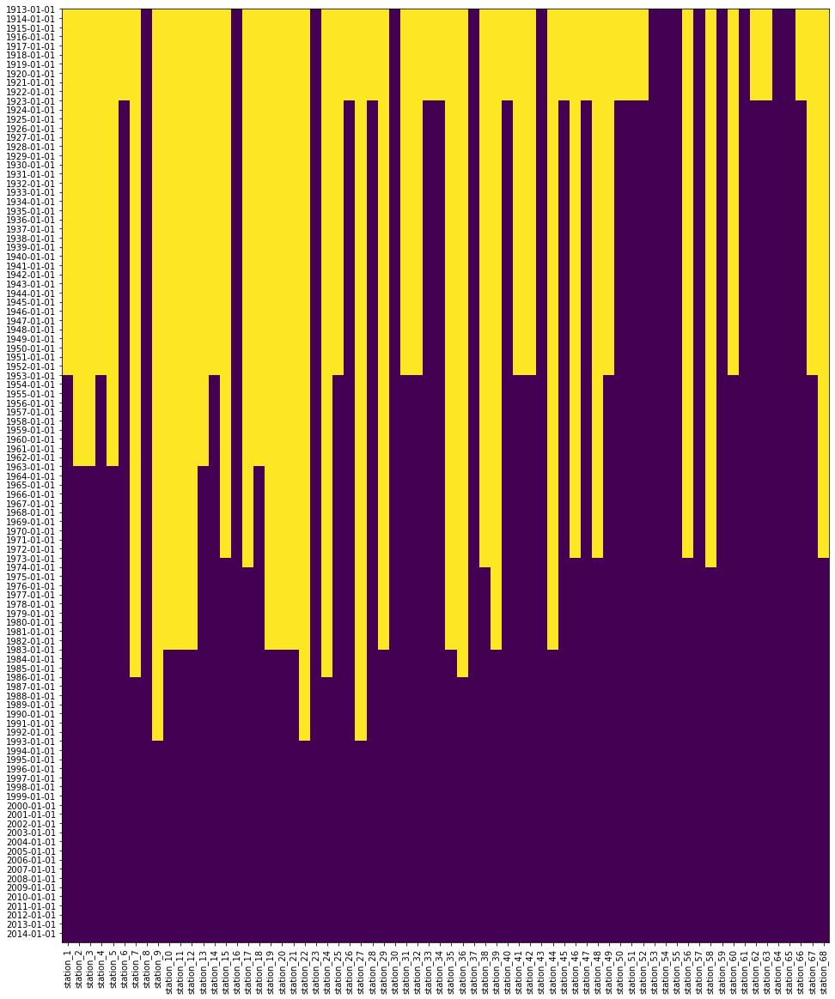

In [16]:
show_nan(Discharges, y_ticks=newyears_disch, only_date=True)

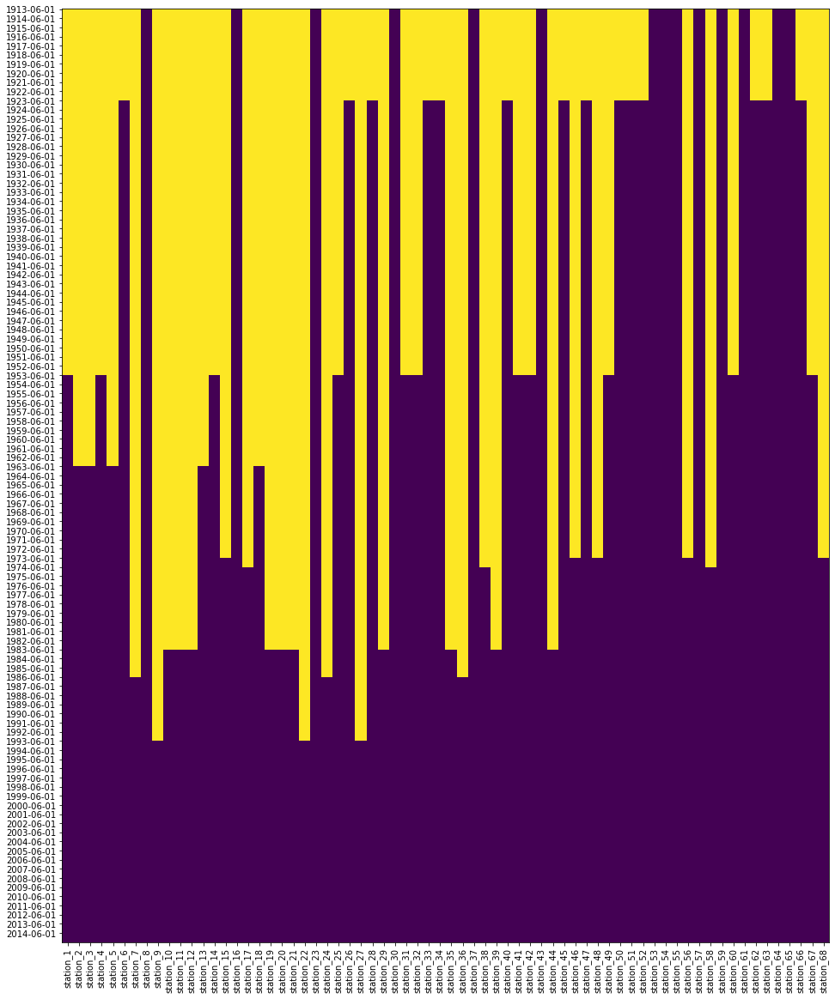

In [17]:
show_nan(Summer, y_ticks=newyears_summ, only_date=True)

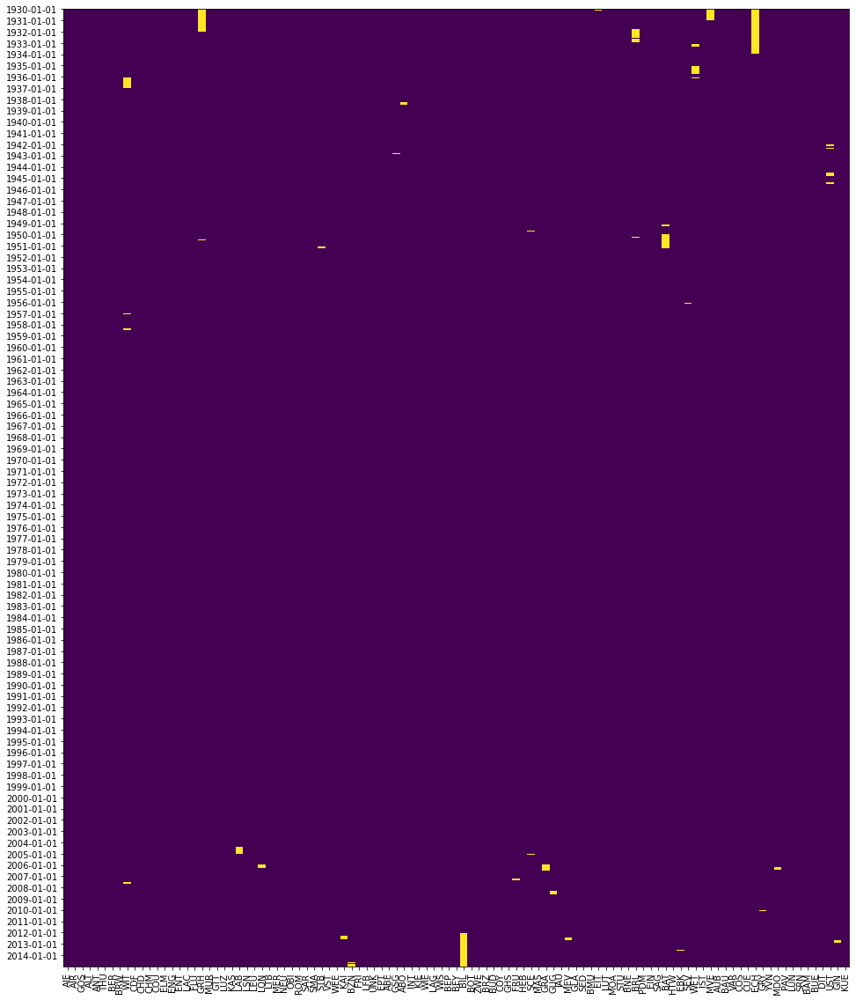

In [18]:
show_nan(Precip, y_ticks=newyears_precip, only_date=True)

# Coordinates conversion

In [19]:
#https://geodesy.geo.admin.ch/reframe/navref?format=json&easting=2649930&northing=1177380&altitude=NaN&input=lv95&output=etrf93-ed
#https://geodesy.geo.admin.ch/reframe/navref?format=json&easting=649930&northing=177380&altitude=NaN&input=lv03&output=etrf93-ed

def swiss_coordinates_to_wgs84(easting, northing, system="MN95"):
    """Transforms swiss MN03 or MN95 coordinates to standard GPS WGS84,
    using https://geodesy.geo.admin.ch/reframe/navref API.
    (interface: https://www.swisstopo.admin.ch/en/maps-data-online/calculation-services/navref.html).
    Coordinates (MN03 and MN95) satisfy: easting > northing, everywhere in Switzerland."""
    E=str(int(easting))
    N=str(int(northing))
    service_url = "https://geodesy.geo.admin.ch/reframe/navref"
    
    if system=="MN95":
        if(len(E)!=7 or len(N)!=7):
            raise(ValueError("Length of MN95 coordinates must be 7 each."))
        resp = requests.get(service_url+"?format=json&easting="+E+"&northing="+N+"&altitude=NaN&input=lv95&output=etrf93-ed").json()
    
    elif system=="MN95-short":
        if(len(E)!=6 or len(N)!=6):
            raise(ValueError("Length of 'MN95-short' coordinates must be 6 each."))
        resp = requests.get(service_url+"?format=json&easting=2"+E+"&northing=1"+N+"&altitude=NaN&input=lv95&output=etrf93-ed").json()
    
    elif system=="MN03":
        if(len(E)!=6 or len(N)!=6):
            raise(ValueError("Length of MN03 coordinates must be 6 each."))
        resp = requests.get(service_url+"?format=json&easting="+E+"&northing="+N+"&altitude=NaN&input=lv03&output=etrf93-ed").json()
    
    else:
        raise(ValueError("Accepted systems: 'MN03' 'MN95' 'MN95-short'"))
    
    result = {"longitude" : float(resp["easting"]),
             "latitude" : float(resp["northing"])}
    return(result)

In [20]:
#mn95 = Stations_info[["X","Y"]].apply(lambda x: pd.Series(
#    swiss_coordinates_to_wgs84(x["X"], x["Y"], system="MN95-short")), axis=1)
#mn03 = Stations_info[["X","Y"]].apply(lambda x: pd.Series(
#    swiss_coordinates_to_wgs84(x["X"], x["Y"], system="MN03")), axis=1)

In [21]:
#mn95 = mn95.add_suffix("95")
#mn03 = mn03.add_suffix("03")
#gps_coord = mn95.join(mn03)
#Stations_info = Stations_info.join(gps_coord)
#Stations_info.to_csv("data_wrangled/info_discharges_gps.csv")

In [22]:
Stations_info = pd.read_csv("data_wrangled/info_discharges_gps.csv", index_col="id")

In [23]:
Stations_info

,Name,BAFU_ID,X,Y,Ave,longitude95,latitude95,longitude03,latitude03
id,,,,,,,,,
1,Allenbach-Adelboden,2232,608710,148300,1.207149,7.552074,46.485963,7.552069,46.485963
2,Grosstalbach-Isenthal,2276,685500,196050,1.795246,8.560952,46.910056,8.560961,46.910053
3,"Alpbach-Erstfeld, Bodenberg",2299,688560,185120,1.584263,8.598992,46.811348,8.599000,46.811344
4,Simme-Oberried / Lenk,2219,602630,141660,2.107648,7.472855,46.426283,7.472850,46.426283
5,Murg-Wängi,2126,714105,261720,1.835344,8.952993,47.496330,8.953004,47.496328
...,...,...,...,...,...,...,...,...,...
64,Reuss-Mellingen,2018,662830,252580,140.732404,8.271271,47.421030,8.271283,47.421030
65,Rhein-Domat/Ems,2602,753890,189370,117.615329,9.456114,46.837670,9.456125,46.837667
66,"Rhein-Diepoldsau, Rietbrücke",2473,766280,250360,230.536477,9.640905,47.383070,9.640909,47.383068


# Merging BAFU info

In [24]:
Stations_BAFU = pd.read_csv("data_wrangled/Webscraped_BAFU_stations_info.csv")
Stations_BAFU

,BAFU_ID,Name,Elevation,Surface_catchment,Mean_elevation_catchment,Glaciation_percent,easting,northing,longitude03,latitude03,longitude95,latitude95
0,2416,"Aabach - Hitzkirch, Richensee ( 2416 )",463.0,73.3,581.0,0.0,661390.0,230220.0,8.249139,47.220062,8.249129,47.220062
1,2312,"Aach - Salmsach, Hungerbühl ( 2312 )",406.0,47.4,467.0,0.0,744410.0,268400.0,9.357226,47.550427,9.357217,47.550432
2,2135,"Aare - Bern, Schönau ( 2135 )",502.0,2941.0,1596.0,5.8,600710.0,198000.0,7.447957,46.933093,7.447956,46.933092
3,2019,Aare - Brienzwiler ( 2019 ),570.0,555.0,2135.0,15.5,649930.0,177380.0,8.092037,46.745741,8.092031,46.745743
4,2016,Aare - Brugg ( 2016 ),332.0,11681.0,1000.0,1.5,657000.0,259360.0,8.194892,47.482538,8.194880,47.482537
...,...,...,...,...,...,...,...,...,...,...,...,...
347,2017,Zugersee - Zug ( 2017 ),414.0,250.0,690.0,0.0,681555.0,224660.0,8.514333,47.167874,8.514322,47.167876
348,6723,Zürich - Aussersihl/Zweierplatz ( 6723 ),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
349,6600,Zürich - Schlachthof ( 6600 ),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
350,2014,Zürichsee (Obersee) - Schmerikon ( 2014 ),410.0,1583.0,1333.0,1.1,713710.0,231515.0,8.940092,47.224774,8.940081,47.224777


In [25]:
Discharges_info = Stations_info.reset_index().merge(Stations_BAFU, how="left",
                                                    left_on="BAFU_ID", right_on="BAFU_ID",
                                                    suffixes=('', '_BAFU'))
Discharges_info.set_index("id", inplace=True)
#CSV save to verify all the matching info
Discharges_info.convert_dtypes().to_csv("data_wrangled/Discharges_info_merge_debug.csv")
#To have the right dtypes in base formats
Discharges_info = pd.read_csv("data_wrangled/Discharges_info_merge_debug.csv",index_col=0)
Discharges_info

,Name,BAFU_ID,X,Y,Ave,longitude95,latitude95,longitude03,latitude03,Name_BAFU,Elevation,Surface_catchment,Mean_elevation_catchment,Glaciation_percent,easting,northing,longitude03_BAFU,latitude03_BAFU,longitude95_BAFU,latitude95_BAFU
id,,,,,,,,,,,,,,,,,,,,
1,Allenbach-Adelboden,2232,608710,148300,1.207149,7.552074,46.485963,7.552069,46.485963,Allenbach - Adelboden ( 2232 ),1297,28.8,1863,0.0,608710,148300,7.552069,46.485963,7.552074,46.485963
2,Grosstalbach-Isenthal,2276,685500,196050,1.795246,8.560952,46.910056,8.560961,46.910053,Grosstalbach - Isenthal ( 2276 ),767,43.9,1819,6.7,685500,196050,8.560961,46.910053,8.560952,46.910056
3,"Alpbach-Erstfeld, Bodenberg",2299,688560,185120,1.584263,8.598992,46.811348,8.599000,46.811344,"Alpbach - Erstfeld, Bodenberg ( 2299 )",1022,20.7,2205,19.7,688560,185120,8.599000,46.811344,8.598992,46.811348
4,Simme-Oberried / Lenk,2219,602630,141660,2.107648,7.472855,46.426283,7.472850,46.426283,Simme - Oberried / Lenk ( 2219 ),1096,34.8,2347,22.6,602630,141660,7.472850,46.426283,7.472855,46.426283
5,Murg-Wängi,2126,714105,261720,1.835344,8.952993,47.496330,8.953004,47.496328,Murg - Wängi ( 2126 ),466,80.2,652,0.0,714105,261720,8.953004,47.496328,8.952993,47.496330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,Reuss-Mellingen,2018,662830,252580,140.732404,8.271271,47.421030,8.271283,47.421030,Reuss - Mellingen ( 2018 ),345,3386.0,1259,1.8,662830,252580,8.271283,47.421030,8.271271,47.421030
65,Rhein-Domat/Ems,2602,753890,189370,117.615329,9.456114,46.837670,9.456125,46.837667,Rhein - Domat/Ems ( 2602 ),575,3229.0,2013,0.9,753890,189370,9.456125,46.837667,9.456114,46.837670
66,"Rhein-Diepoldsau, Rietbrücke",2473,766280,250360,230.536477,9.640905,47.383070,9.640909,47.383068,"Rhein - Diepoldsau, Rietbrücke ( 2473 )",410,6299.0,1771,0.7,766280,250360,9.640909,47.383068,9.640905,47.383070


In [26]:
Discharges_info.isnull().sum()

Name                        0
BAFU_ID                     0
X                           0
Y                           0
Ave                         0
longitude95                 0
latitude95                  0
longitude03                 0
latitude03                  0
Name_BAFU                   0
Elevation                   0
Surface_catchment           0
Mean_elevation_catchment    0
Glaciation_percent          0
easting                     0
northing                    0
longitude03_BAFU            0
latitude03_BAFU             0
longitude95_BAFU            0
latitude95_BAFU             0
dtype: int64

In [27]:
(Stations_BAFU.Mean_elevation_catchment%1).value_counts(dropna=False)

0.0    235
NaN    117
Name: Mean_elevation_catchment, dtype: int64

### Divergences in information

In [28]:
Discharges_info[(Discharges_info.X!=Discharges_info.easting)]

,Name,BAFU_ID,X,Y,Ave,longitude95,latitude95,longitude03,latitude03,Name_BAFU,Elevation,Surface_catchment,Mean_elevation_catchment,Glaciation_percent,easting,northing,longitude03_BAFU,latitude03_BAFU,longitude95_BAFU,latitude95_BAFU
id,,,,,,,,,,,,,,,,,,,,
20,"Plessur-Chur, nur Hauptstation",2185,757975,191935,5.714818,9.510531,46.859777,9.510542,46.859774,"Plessur - Chur, nur Hauptstation ( 2185 )",573,264.0,1868,0.0,757914,191990,9.509761,46.860284,9.509750,46.860286
27,Glenner-Castrisch,2498,735330,181790,8.989251,9.210639,46.773536,9.210647,46.773533,Glenner - Castrisch ( 2498 ),696,381.0,2022,1.1,735329,181796,9.210636,46.773587,9.210627,46.773591
42,Kleine Emme-Emmen,2634,663550,213785,15.233040,8.275332,47.072037,8.275342,47.072036,Kleine Emme - Emmen ( 2634 ),430,478.0,1054,0.0,663700,213630,8.277295,47.070627,8.277285,47.070628
45,Landquart-Felsenbach,2150,765365,204910,24.299313,9.612119,46.974649,9.612129,46.974648,Landquart - Felsenbach ( 2150 ),571,614.0,1797,0.7,765364,204910,9.612116,46.974648,9.612106,46.974649
47,Muota-Ingenbohl,2084,688230,206140,19.074864,8.598741,47.000451,8.598750,47.000449,Muota - Ingenbohl ( 2084 ),438,317.0,1363,0.0,688262,206170,8.599177,47.000715,8.599167,47.000717
54,Vorderrhein-Ilanz,2033,735000,182030,34.348256,9.206390,46.775762,9.206398,46.775758,Vorderrhein - Ilanz ( 2033 ),693,774.0,2030,1.8,734997,182035,9.206361,46.775804,9.206352,46.775807


In [29]:
Discharges_info[(Discharges_info.Y!=Discharges_info.northing)]

,Name,BAFU_ID,X,Y,Ave,longitude95,latitude95,longitude03,latitude03,Name_BAFU,Elevation,Surface_catchment,Mean_elevation_catchment,Glaciation_percent,easting,northing,longitude03_BAFU,latitude03_BAFU,longitude95_BAFU,latitude95_BAFU
id,,,,,,,,,,,,,,,,,,,,
20,"Plessur-Chur, nur Hauptstation",2185,757975,191935,5.714818,9.510531,46.859777,9.510542,46.859774,"Plessur - Chur, nur Hauptstation ( 2185 )",573,264.0,1868,0.0,757914,191990,9.509761,46.860284,9.509750,46.860286
27,Glenner-Castrisch,2498,735330,181790,8.989251,9.210639,46.773536,9.210647,46.773533,Glenner - Castrisch ( 2498 ),696,381.0,2022,1.1,735329,181796,9.210636,46.773587,9.210627,46.773591
42,Kleine Emme-Emmen,2634,663550,213785,15.233040,8.275332,47.072037,8.275342,47.072036,Kleine Emme - Emmen ( 2634 ),430,478.0,1054,0.0,663700,213630,8.277295,47.070627,8.277285,47.070628
47,Muota-Ingenbohl,2084,688230,206140,19.074864,8.598741,47.000451,8.598750,47.000449,Muota - Ingenbohl ( 2084 ),438,317.0,1363,0.0,688262,206170,8.599177,47.000715,8.599167,47.000717
54,Vorderrhein-Ilanz,2033,735000,182030,34.348256,9.206390,46.775762,9.206398,46.775758,Vorderrhein - Ilanz ( 2033 ),693,774.0,2030,1.8,734997,182035,9.206361,46.775804,9.206352,46.775807


In [30]:
Stations_info_keep = Discharges_info[['Name','BAFU_ID','Ave','Elevation','Surface_catchment',
                                      'Mean_elevation_catchment','Glaciation_percent',
                                      'X','Y','longitude95','latitude95','longitude03','latitude03']]
Stations_info_keep.to_csv("data_wrangled/Discharges_info_merged.csv")

# Interactive Map

In [31]:
#https://ogre.adc4gis.com/convert
#http://geojson.io/#map=12/46.2122/6.1111
map_ch=folium.Map(location=[46.8,8.2],zoom_start=8,tiles='cartodbpositron')#'Stamen Toner'
#folium.TileLayer('openstreetmap').add_to(map_ge)
#geo_communes = json.load(open(r'SITG/CAD_COMMUNE.geo.json'))#.geo.json

DischLayer = folium.FeatureGroup(name="Discharges", overlay=True, control=True, show=True)
for disch_stati in Stations_info_keep.iterrows():
    folium.Marker(
        location=[disch_stati[1]["latitude95"], disch_stati[1]["longitude95"]],
        icon=folium.Icon(color='darkblue', icon_color='white', icon='tint',
                         angle=0, prefix='fa'),#prefix='glyphicon'
        #tooltip="hey!",
        popup=disch_stati[1][["BAFU_ID","Name","Ave",'Elevation','Surface_catchment',
                              'Mean_elevation_catchment','Glaciation_percent',]].to_frame().to_html(
            classes='table table-striped table-hover table-condensed table-responsive')
    ).add_to(DischLayer)
map_ch.add_child(DischLayer)


PrecipLayer = folium.FeatureGroup(name="Precipitations", overlay=True, control=True, show=True)
for precip_stati in PrecipInfo.iterrows():
    folium.Marker(
        location=[precip_stati[1]["latitude"], precip_stati[1]["longitude"]],
        icon=folium.Icon(color='lightblue', icon_color='white', icon='cloud',
                         angle=0, prefix='fa'),#prefix='glyphicon'
        #tooltip="hey!",
        popup=precip_stati[1][["name","Elevation","maxMean","totMean",
                               "startYear","endYear","pctNA"]].to_frame().to_html(
            classes='table table-striped table-hover table-condensed table-responsive')
    ).add_to(PrecipLayer)
map_ch.add_child(PrecipLayer)

#['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen',
#'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

map_ch.add_child(folium.LatLngPopup())
folium.LayerControl(collapsed=False).add_to(map_ch)
map_ch.save(os.path.join('Results', 'Switzerland_Discharges_and_Precipitations_map.html'))
map_ch

# Time Series of Discharges

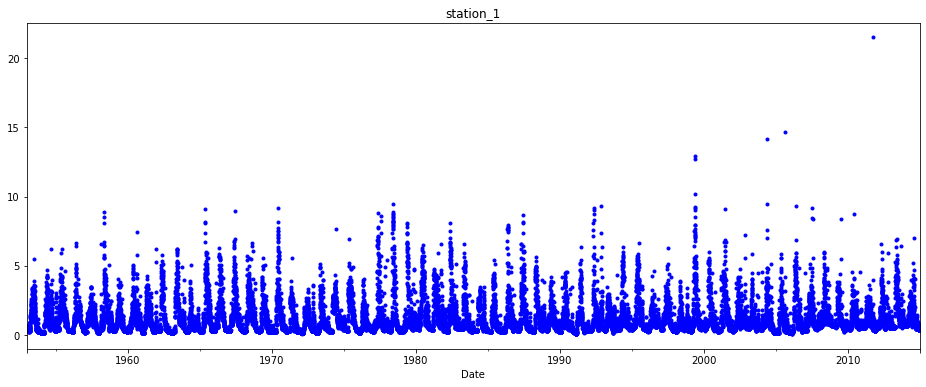

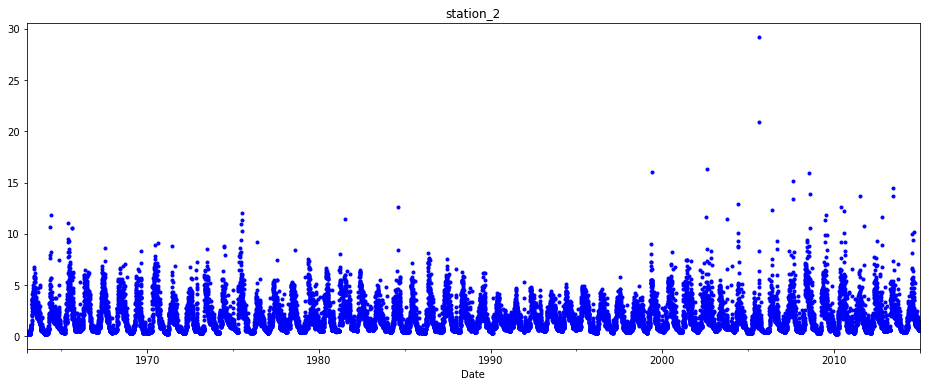

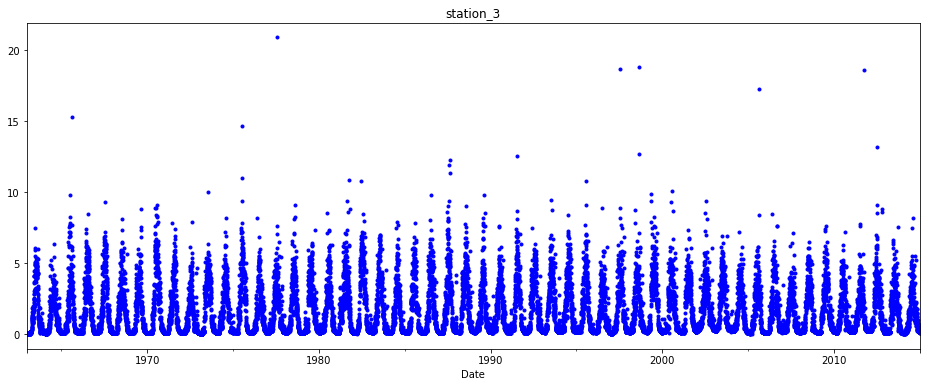

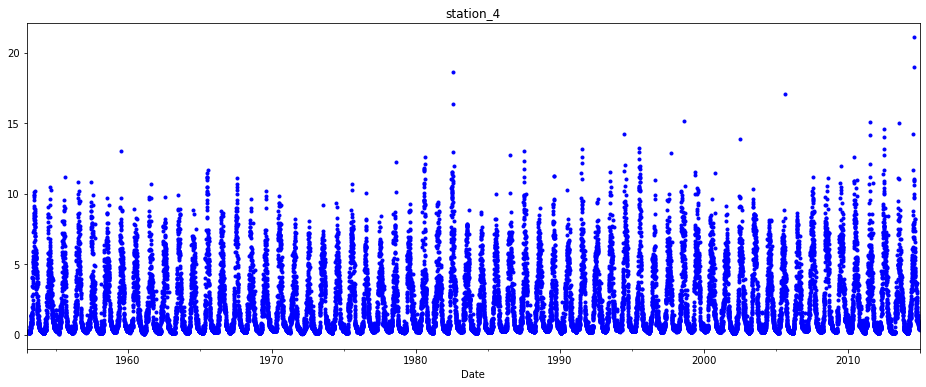

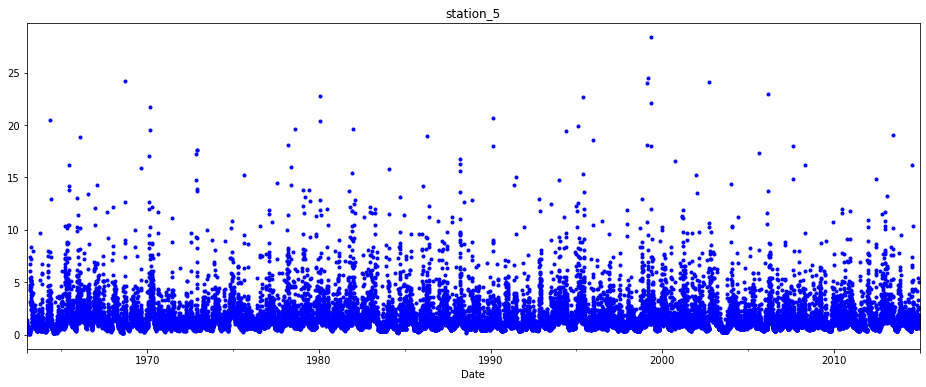

...

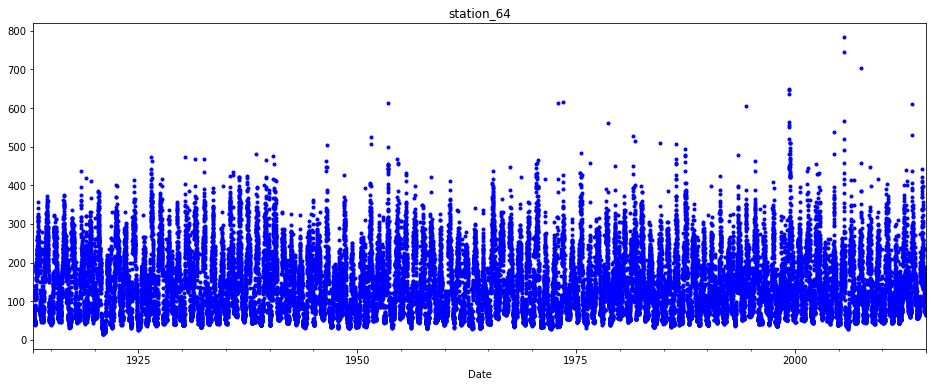

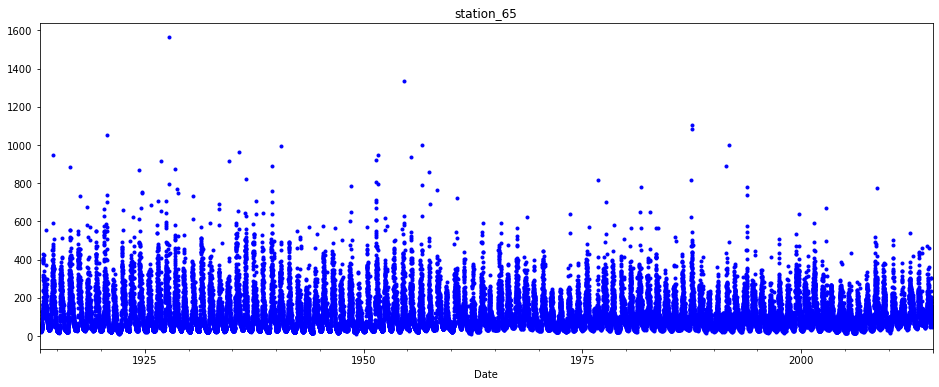

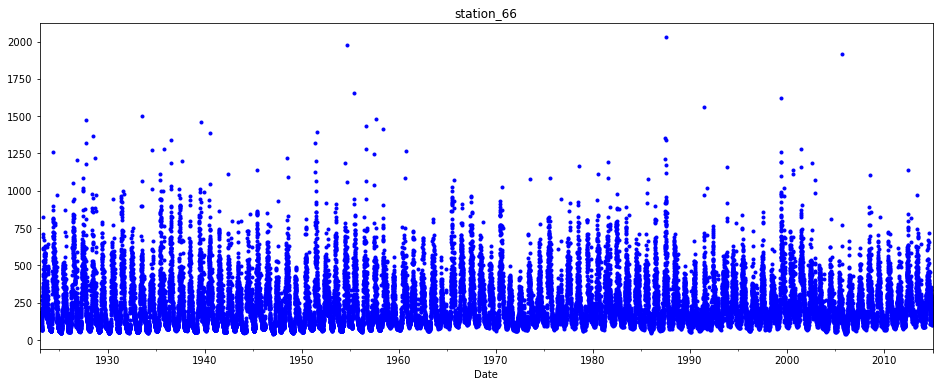

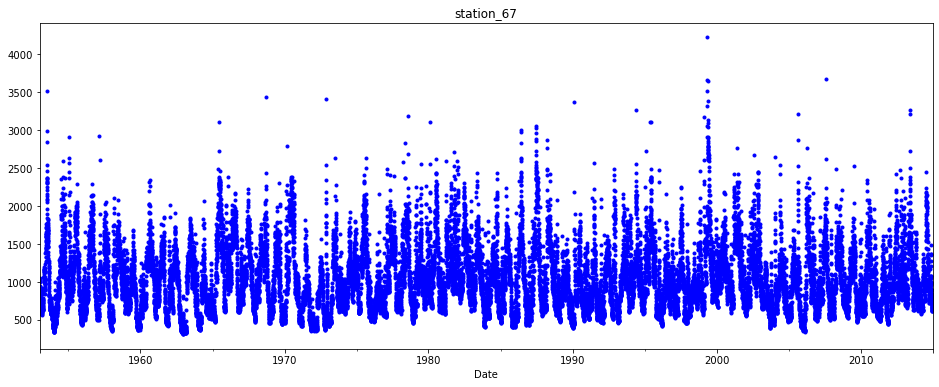

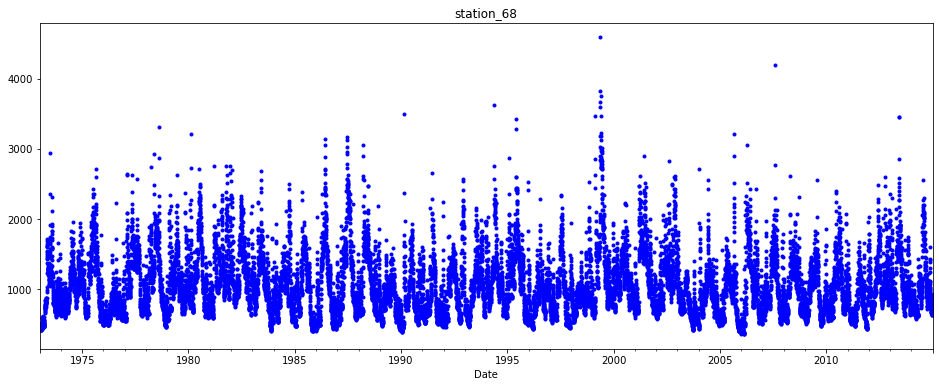

In [32]:
Discharges.sort_index(inplace=True)
for sta in Discharges.columns:
    Discharges[sta].dropna().plot(style="b.", figsize=(16,6), title=sta)#"bo"
    plt.show()

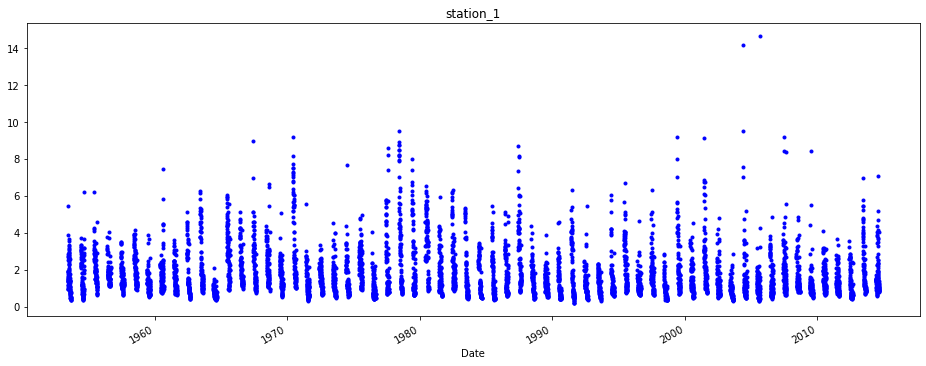

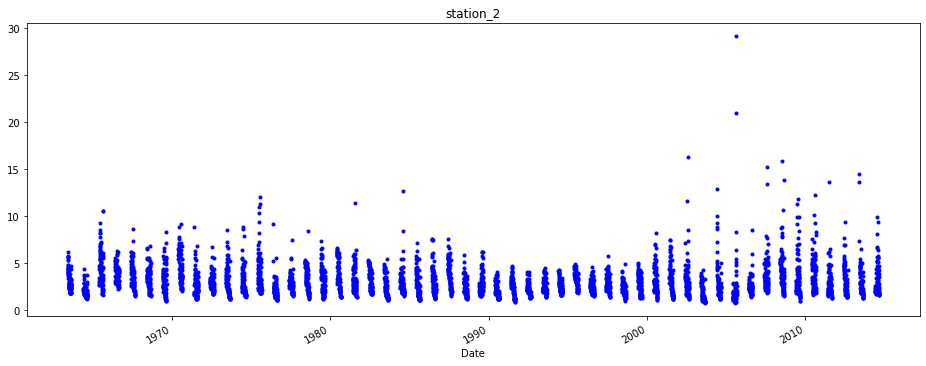

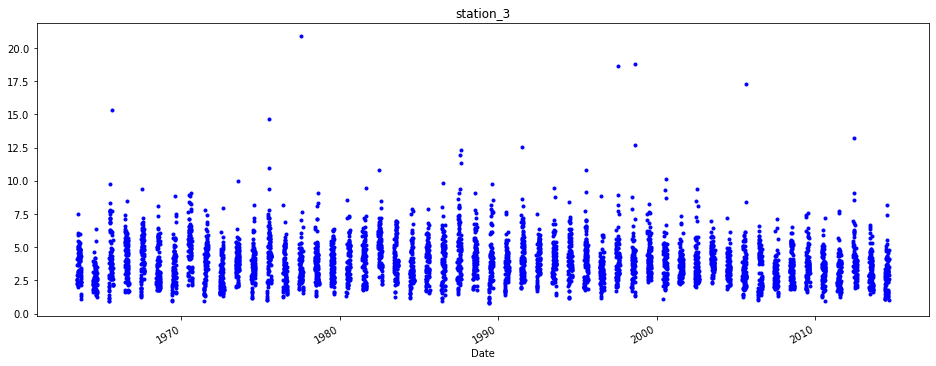

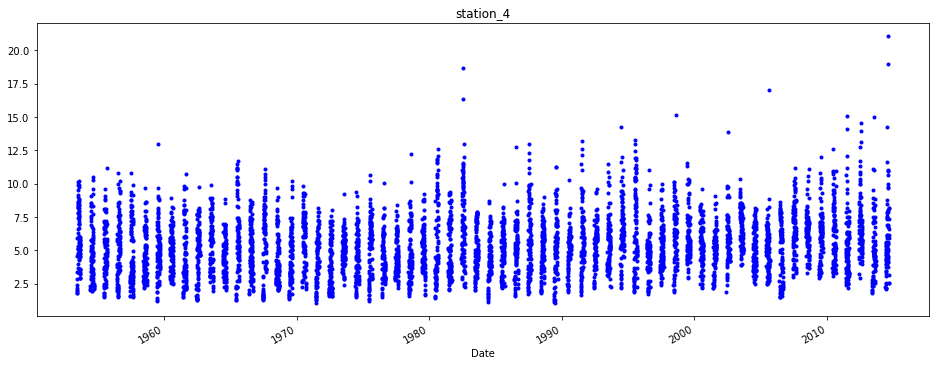

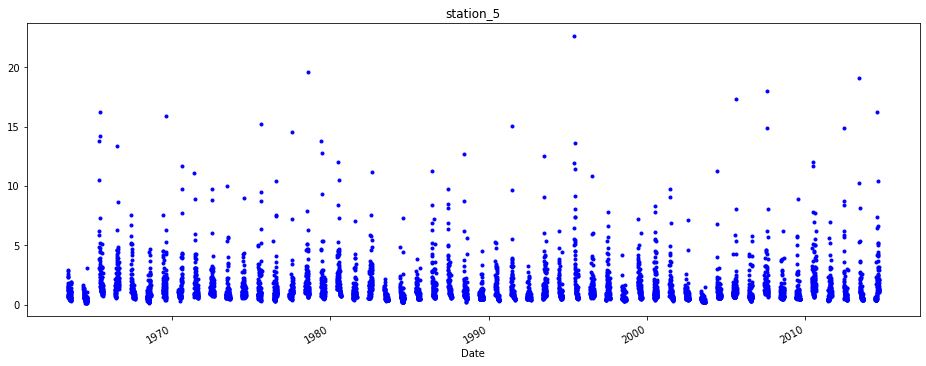

...

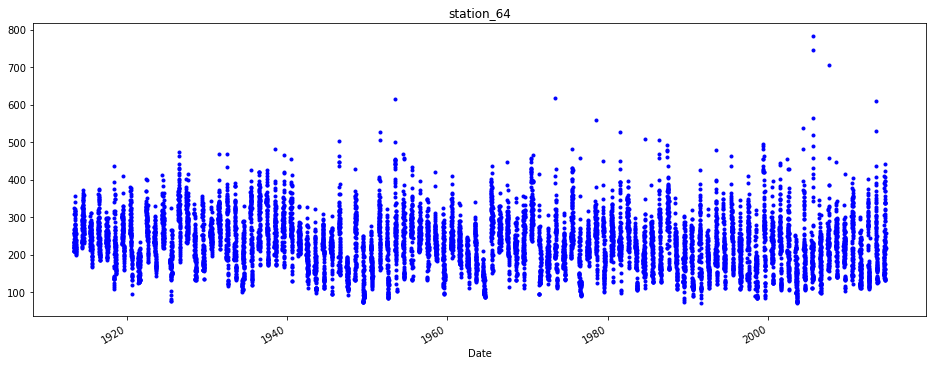

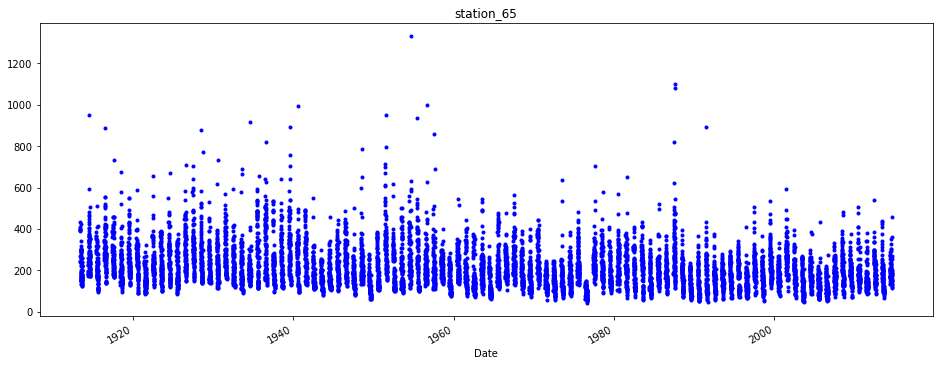

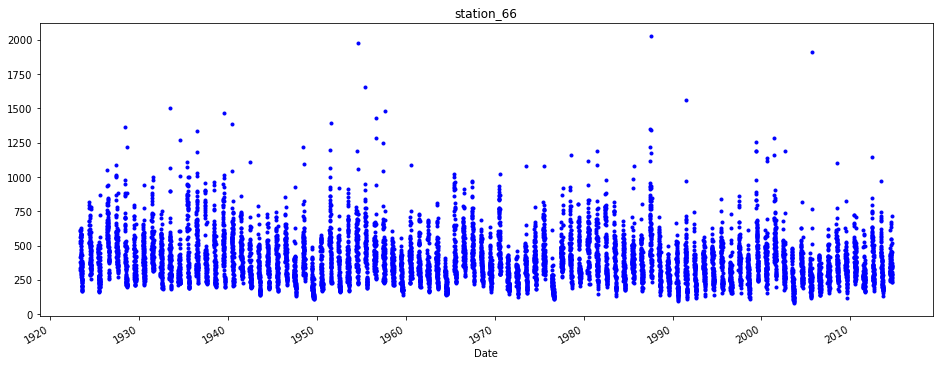

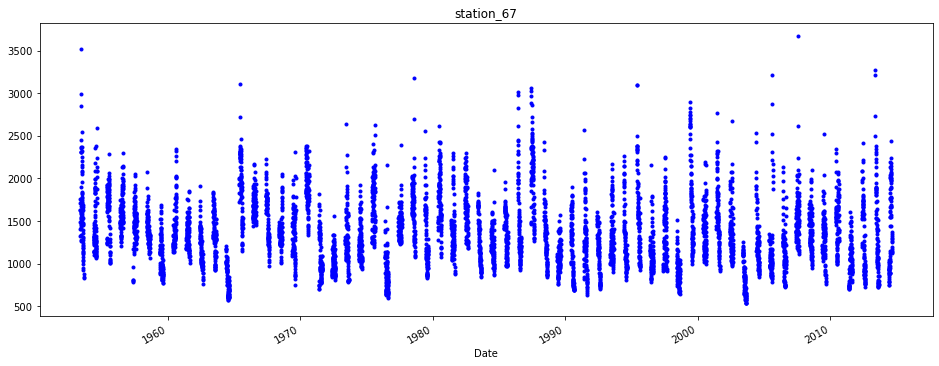

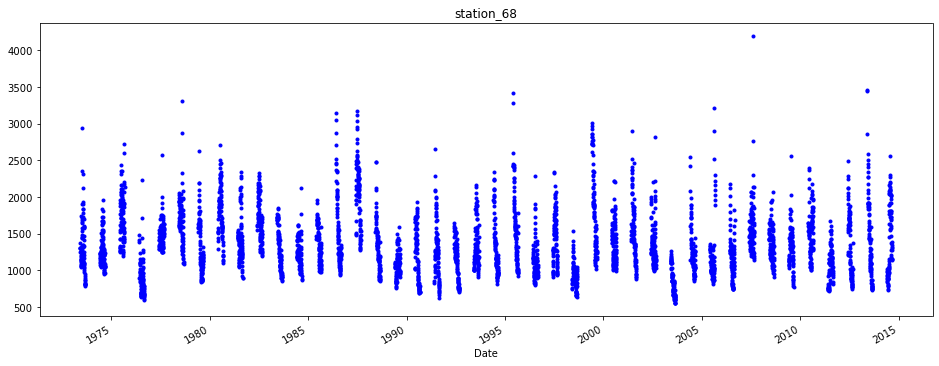

In [33]:
Summer.sort_index(inplace=True)
for sta in Summer.columns:
    Summer[sta].dropna().plot(style="b.", figsize=(16,6), title=sta)#"bo"
    plt.show()

# Time Series of Precipitations

In [34]:
Precip.min().sort_values()

GSG   -0.1
AIE    0.0
BNE    0.0
STU    0.0
MOA    0.0
      ... 
NEU    0.0
MER    0.0
LTB    0.0
GIN    0.0
KUE    0.0
Length: 105, dtype: float64

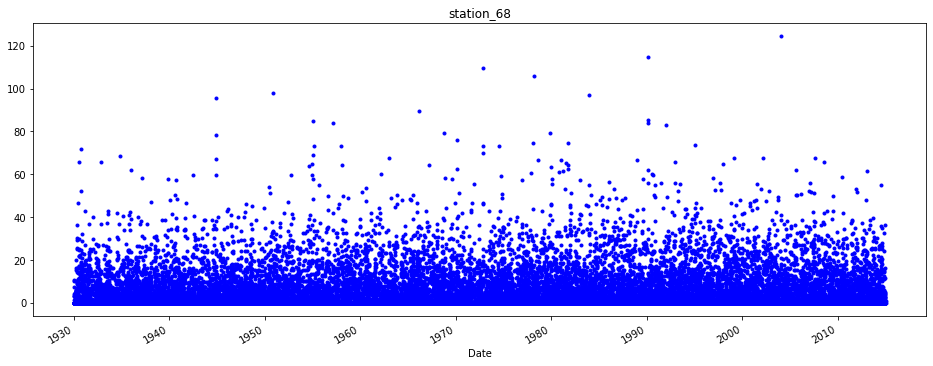

In [35]:
Precip["GSG"].dropna().plot(style="b.", figsize=(16,6), title=sta)#"bo"
plt.show()#negative min station

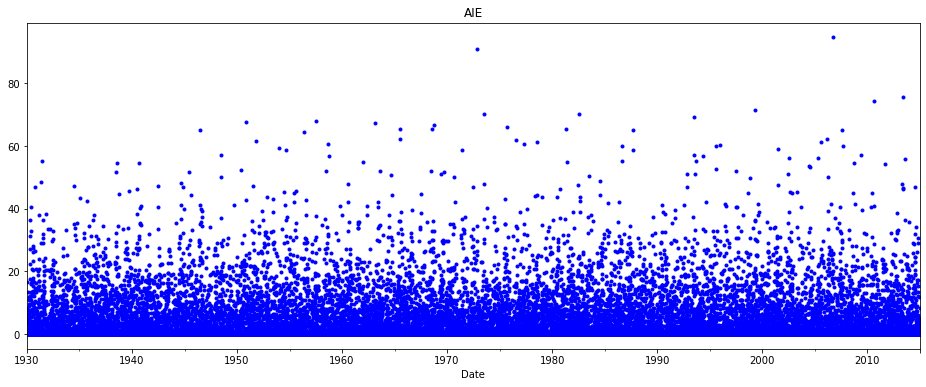

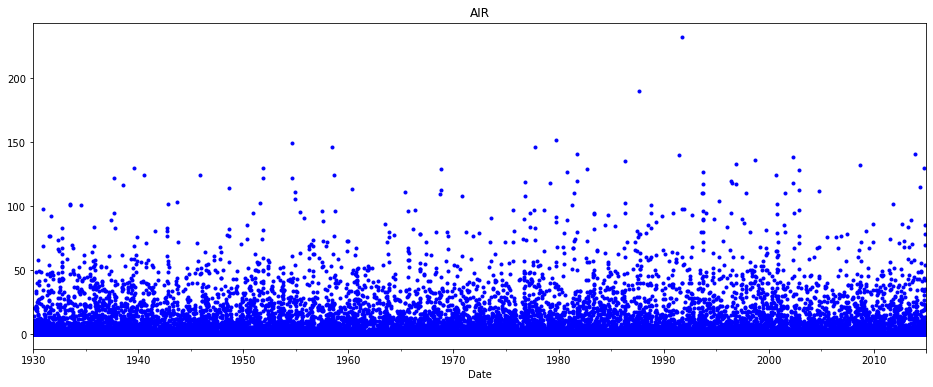

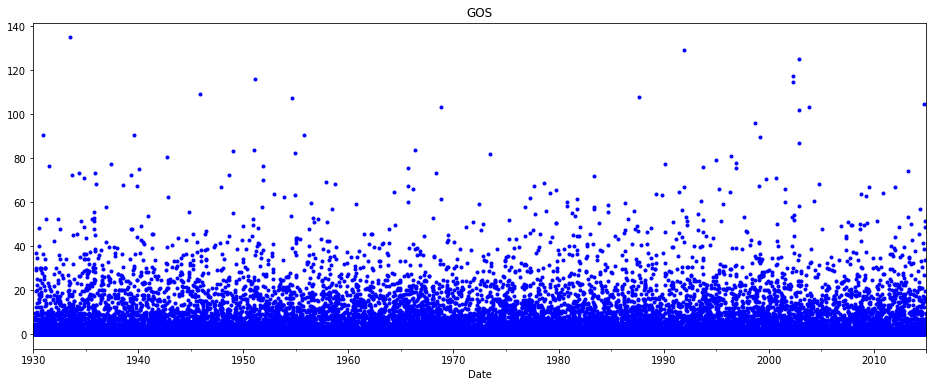

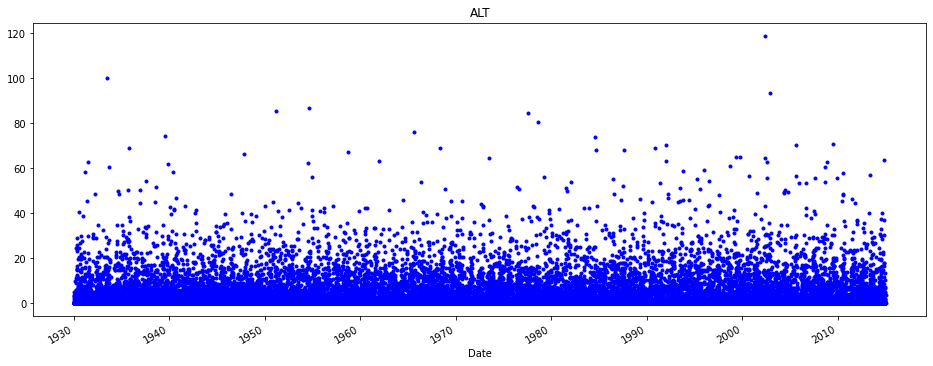

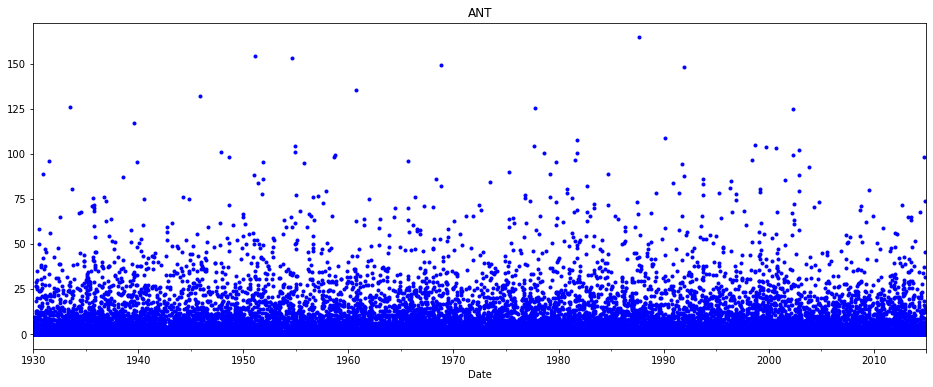

...

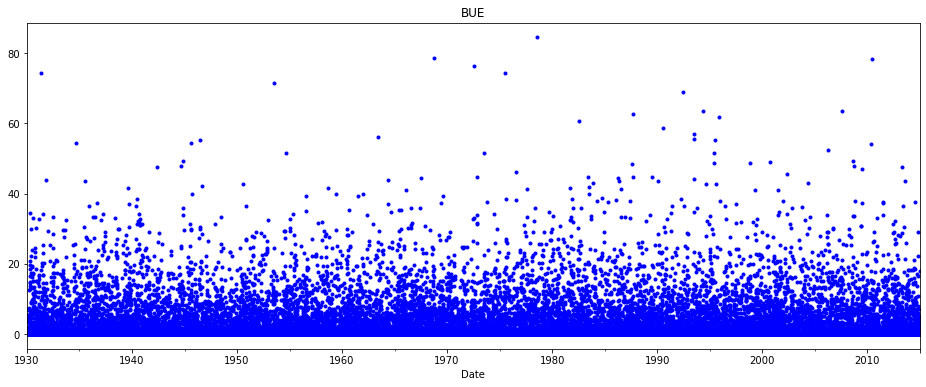

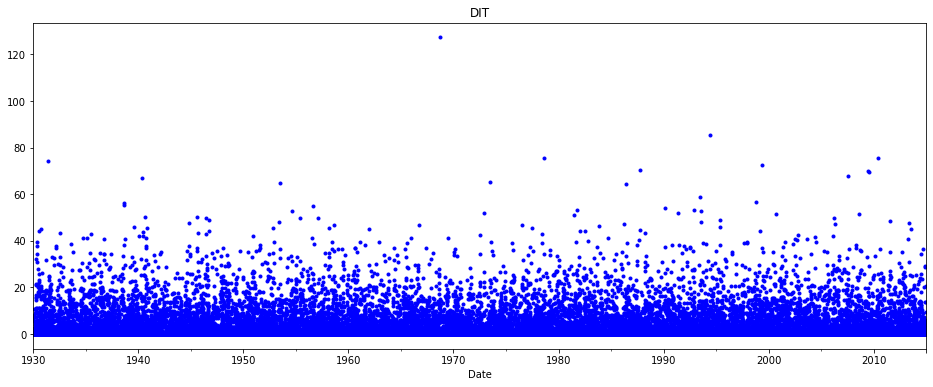

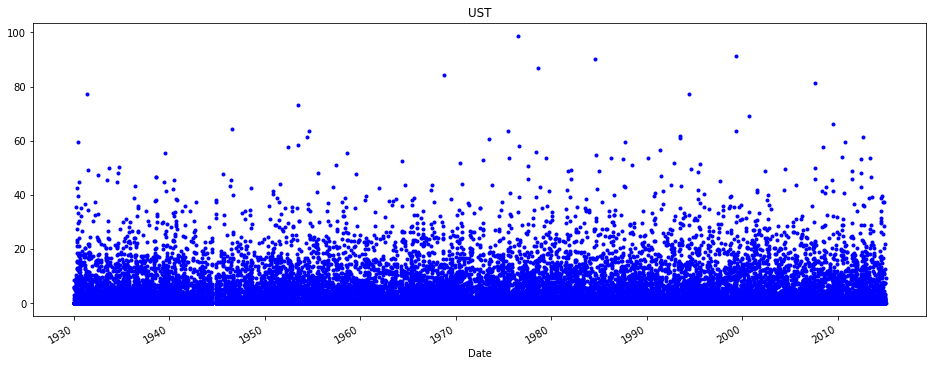

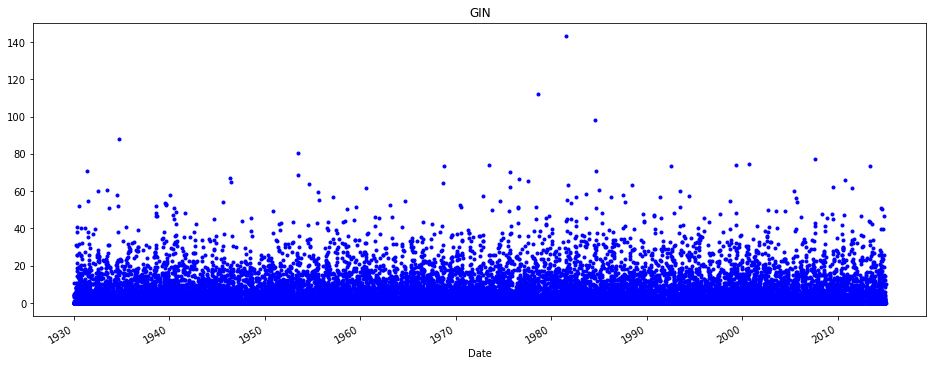

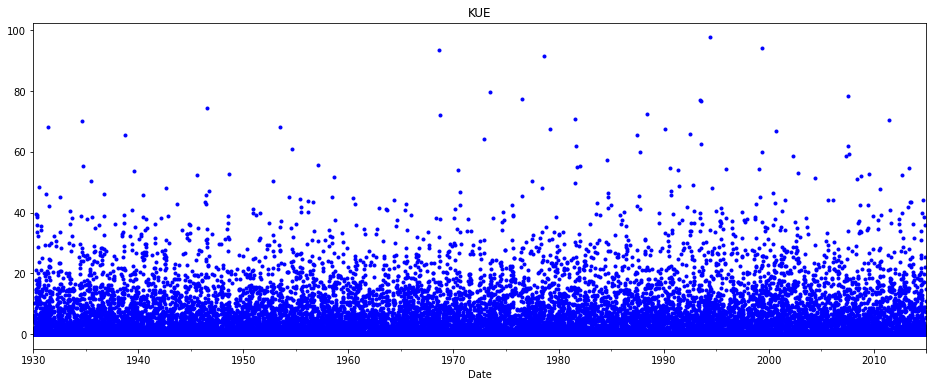

In [36]:
Precip.sort_index(inplace=True)
for sta in Precip.columns:
    Precip[sta].dropna().plot(style="b.", figsize=(16,6), title=sta)#"bo"
    plt.show()